# Setup

In [1]:
# Data manipulation
import numpy as np
import pandas as pd

# Data preprocessing
import math

# Data visualization
import gif
from plotly import express as xp
from plotly import graph_objects as go

## Pandas

In [2]:
# Suppress the "SettingWithCopy" warnings.
pd.options.mode.chained_assignment = None

## Plotly

In [3]:
def export_gif(fig, path, duration=200):
    """
    Export an animated Plotly `Figure` to a gif image.
    """
    # Decorate a plot function which returns a Plotly `Figure` with `gif.frame`.
    @gif.frame
    def plot(index):
        snap = go.Figure()
        
        for trace in fig.frames[index].data:
            snap.add_trace(trace)
        
        snap.add_annotation(x=0.05, 
                            y=0.05,
                            xref="paper", 
                            yref="paper", 
                            text=fig.layout.sliders[0].steps[index].label,
                            font={"family": "sans", 
                                  "size": 20},
                            showarrow=False)
        
        snap.layout = fig.layout
        snap.layout.pop("margin", None) 
        snap.layout.pop("sliders", None) 
        snap.layout.pop("updatemenus", None)
        
        return snap

    # Construct a list of frames.
    frames = [plot(index) for index, _ in enumerate(fig.frames)]
    
    # Specify a duration (in milliseconds) between each frame.
    gif.save(frames, path, duration=duration)

In [4]:
def prettify(fig):
    """
    Prettify the `Figure`.
    """
    fig.update_layout(font={"family": "sans", 
                            "size": 14}, 
                      hoverlabel={"bordercolor": "white", 
                                  "font": {"color": "white", 
                                           "family": "sans", 
                                           "size": 12}}, 
                      title={"font": {"size": 20}},
                      template="plotly_white")
    
    fig.update_traces(opacity=0.6)
    fig.update_traces(marker={"line": {"color": "white", 
                                       "width": 0.5}}, 
                      selector={"type": "histogram"})
    
    fig.update_xaxes(ticks="outside", 
                     tickcolor="white", 
                     ticklen=10)
    
    fig.update_yaxes(ticks="outside", 
                     tickcolor="white", 
                     ticklen=10)
    
    for trace in fig.data:
        update_in(trace, ["hovertemplate"], str.replace, "=", " = ")

    for frame in fig.frames:
        for trace in frame.data:
            update_in(trace, ["hovertemplate"], str.replace, "=", " = ")
            
    for annot in fig.layout.annotations:
        update_in(annot, ["text"], str.replace, "=", " = ")
        
    for slider in fig.layout.sliders:
        update_in(slider, ["currentvalue", "prefix"], str.replace, "=", " = ")
    
    return fig

In [5]:
def update_in(obj, keys, func, *args, **kwargs):
    """
    Update a value in a nested structure by applying a function on it.
    """
    key = keys.pop(0)
    if keys:
        update_in(obj[key], keys, func, *args, **kwargs)
    else:
        try:
            obj[key] = func(obj[key], *args, **kwargs)
        except Exception as e:
            print(e)

In [6]:
# Monkey patch the `graph_objects.Figure` class to add custom methods.
go.Figure.export_gif = export_gif
go.Figure.prettify = prettify
go.Figure.update_in = update_in

# Data

In [7]:
test = pd.read_csv("../data/test.csv")
train = pd.read_csv("../data/train.csv")
spray = pd.read_csv("../data/spray.csv")
weather = pd.read_csv("../data/weather.csv")

In [8]:
print("   Test :", test.shape)
print("  Train :", train.shape)
print("  Spray :", spray.shape)
print("Weather :", weather.shape)

   Test : (116293, 11)
  Train : (10506, 12)
  Spray : (14835, 4)
Weather : (2944, 22)


## Test

In [9]:
test.head()

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
2,3,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
3,4,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX SALINARIUS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
4,5,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX TERRITANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


In [10]:
# Drop unnecessary columns.
test.drop(columns=["Address", "Block", "Street", "AddressNumberAndStreet", "AddressAccuracy"], inplace=True)

# Convert the `Date` column to a datetime type.
test["Date"] = pd.to_datetime(test["Date"])

In [11]:
test.head()

,Id,Date,Species,Trap,Latitude,Longitude
0,1,2008-06-11,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991
1,2,2008-06-11,CULEX RESTUANS,T002,41.95469,-87.800991
2,3,2008-06-11,CULEX PIPIENS,T002,41.95469,-87.800991
3,4,2008-06-11,CULEX SALINARIUS,T002,41.95469,-87.800991
4,5,2008-06-11,CULEX TERRITANS,T002,41.95469,-87.800991


In [12]:
test.dtypes

Id                    int64
Date         datetime64[ns]
Species              object
Trap                 object
Latitude            float64
Longitude           float64
dtype: object

In [13]:
test.isna().sum()

Id           0
Date         0
Species      0
Trap         0
Latitude     0
Longitude    0
dtype: int64

In [14]:
test.shape

(116293, 6)

## Train

In [15]:
train.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0


In [16]:
# There are duplicated rows in our train data.
train.duplicated(subset=train.drop(columns=["NumMosquitos", "WnvPresent"]).columns).sum()

2031

In [17]:
# Remove duplicated rows, keeping only the rows with maximum values.
train = train.groupby(train.drop(columns=["NumMosquitos", "WnvPresent"]).columns.to_list()).max().reset_index()

In [18]:
train.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"1100 Roosevelt Road, Chicago, IL 60608, USA",CULEX PIPIENS/RESTUANS,11,W ROOSEVELT,T048,"1100 W ROOSEVELT, Chicago, IL",41.867108,-87.654224,8,1,0
1,2007-05-29,"1100 Roosevelt Road, Chicago, IL 60608, USA",CULEX RESTUANS,11,W ROOSEVELT,T048,"1100 W ROOSEVELT, Chicago, IL",41.867108,-87.654224,8,2,0
2,2007-05-29,"1100 South Peoria Street, Chicago, IL 60608, USA",CULEX RESTUANS,11,S PEORIA ST,T091,"1100 S PEORIA ST, Chicago, IL",41.862292,-87.648860,8,1,0
3,2007-05-29,"1100 West Chicago Avenue, Chicago, IL 60642, USA",CULEX RESTUANS,11,W CHICAGO,T049,"1100 W CHICAGO, Chicago, IL",41.896282,-87.655232,8,1,0
4,2007-05-29,"1500 North Long Avenue, Chicago, IL 60651, USA",CULEX RESTUANS,15,N LONG AVE,T153,"1500 N LONG AVE, Chicago, IL",41.907645,-87.760886,8,1,0


In [19]:
train.shape

(8475, 12)

In [20]:
# Drop unneccessary columns.
train.drop(columns=["Address", "Block", "Street", "AddressNumberAndStreet", "AddressAccuracy"], inplace=True)

In [21]:
# Convert the `Date` column to a datetime type.
train["Date"] = pd.to_datetime(train["Date"])

In [22]:
# Sort by `Date`.
train.sort_values("Date", ascending=True, inplace=True)

In [23]:
train.head()

,Date,Species,Trap,Latitude,Longitude,NumMosquitos,WnvPresent
0,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,1,0
24,2007-05-29,CULEX RESTUANS,T129,41.891126,-87.611560,2,0
23,2007-05-29,CULEX PIPIENS/RESTUANS,T129,41.891126,-87.611560,1,0
22,2007-05-29,CULEX RESTUANS,T159,41.732984,-87.649642,1,0
21,2007-05-29,CULEX RESTUANS,T015,41.974089,-87.824812,4,0


In [24]:
train.dtypes

Date            datetime64[ns]
Species                 object
Trap                    object
Latitude               float64
Longitude              float64
NumMosquitos             int64
WnvPresent               int64
dtype: object

In [25]:
train.isna().sum()

Date            0
Species         0
Trap            0
Latitude        0
Longitude       0
NumMosquitos    0
WnvPresent      0
dtype: int64

In [26]:
train.shape

(8475, 7)

## Spray

In [27]:
spray.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [28]:
# Drop duplicated rows, if any.
spray.drop_duplicates(inplace=True)

In [29]:
# Drop unnecessary columns.
spray.drop(columns="Time", inplace=True)

In [30]:
# Convert the `Date` column to a datetime type.
spray["Date"] = pd.to_datetime(spray["Date"])

In [31]:
# Sort by `Date`.
spray.sort_values("Date", ascending=True, inplace=True)

In [32]:
spray.head()

,Date,Latitude,Longitude
0,2011-08-29,42.391623,-88.089163
69,2011-08-29,42.390335,-88.096443
68,2011-08-29,42.390642,-88.096440
67,2011-08-29,42.390952,-88.096437
66,2011-08-29,42.391238,-88.096468


In [33]:
spray.dtypes

Date         datetime64[ns]
Latitude            float64
Longitude           float64
dtype: object

In [34]:
spray.isna().sum()

Date         0
Latitude     0
Longitude    0
dtype: int64

In [35]:
spray.shape

(14294, 3)

## Weather

In [36]:
weather.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,...,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,...,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,...,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


In [37]:
# Convert the `Date` column to a datetime type.
weather["Date"] = pd.to_datetime(weather["Date"])

In [38]:
# Sort by `Date` and `Station`.
weather.sort_values(["Date", "Station"], ascending=True, inplace=True)

In [39]:
weather.dtypes

Station                 int64
Date           datetime64[ns]
Tmax                    int64
Tmin                    int64
Tavg                   object
Depart                 object
DewPoint                int64
WetBulb                object
Heat                   object
Cool                   object
Sunrise                object
Sunset                 object
CodeSum                object
Depth                  object
Water1                 object
SnowFall               object
PrecipTotal            object
StnPressure            object
SeaLevel               object
ResultSpeed           float64
ResultDir               int64
AvgSpeed               object
dtype: object

In [40]:
weather.isna().sum()

Station        0
Date           0
Tmax           0
Tmin           0
Tavg           0
Depart         0
DewPoint       0
WetBulb        0
Heat           0
Cool           0
Sunrise        0
Sunset         0
CodeSum        0
Depth          0
Water1         0
SnowFall       0
PrecipTotal    0
StnPressure    0
SeaLevel       0
ResultSpeed    0
ResultDir      0
AvgSpeed       0
dtype: int64

# Preprocessing

## Data Imputation

### Weather

In [41]:
# Locate numerically inconvertiable data.  
innumericables = weather.apply(lambda x: pd.to_numeric(x, errors="coerce").isna())

In [42]:
innumericables

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,False,False,False
1,False,False,False,False,False,True,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,False,False,False
3,False,False,False,False,False,True,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2939,False,False,False,False,False,True,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
2940,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,False,False,False
2941,False,False,False,False,False,True,False,False,False,False,...,True,True,True,True,True,False,False,False,False,False
2942,False,False,False,False,False,False,False,False,False,False,...,True,False,True,False,False,False,False,False,False,False


In [43]:
# Count the number of numerically inconvertible data in each column.
innumericables.sum()

Station           0
Date              0
Tmax              0
Tmin              0
Tavg             11
Depart         1472
DewPoint          0
WetBulb           4
Heat             11
Cool             11
Sunrise        1472
Sunset         1472
CodeSum        2944
Depth          1472
Water1         2944
SnowFall       1484
PrecipTotal     320
StnPressure       4
SeaLevel          9
ResultSpeed       0
ResultDir         0
AvgSpeed          3
dtype: int64

In [44]:
# Identify the numerically inconvertiable data in each column.
non_numerics = weather[innumericables].apply(lambda x: set(x.dropna()))

In [45]:
non_numerics

Station                                                       {}
Date                                                          {}
Tmax                                                          {}
Tmin                                                          {}
Tavg                                                         {M}
Depart                                                       {M}
DewPoint                                                      {}
WetBulb                                                      {M}
Heat                                                         {M}
Cool                                                         {M}
Sunrise                                                      {-}
Sunset                                                       {-}
CodeSum        {RA, TS RA BR, TS, BR HZ, TSRA RA HZ FU, TS TS...
Depth                                                        {M}
Water1                                                       {M}
SnowFall                 

In [46]:
# Missing data in the `CodeSum` column is represented by a blank space.
non_numerics["CodeSum"]

{' ',
 'BCFG BR',
 'BR',
 'BR HZ',
 'BR HZ FU',
 'BR HZ VCFG',
 'BR VCTS',
 'DZ',
 'DZ BR',
 'DZ BR HZ',
 'FG BR HZ',
 'FG+',
 'FG+ BCFG BR',
 'FG+ BR',
 'FG+ BR HZ',
 'FG+ FG BR',
 'FG+ FG BR HZ',
 'FG+ MIFG BR',
 'FU',
 'HZ',
 'HZ FU',
 'HZ VCTS',
 'MIFG BCFG BR',
 'RA',
 'RA BCFG BR',
 'RA BR',
 'RA BR FU',
 'RA BR HZ',
 'RA BR HZ FU',
 'RA BR HZ VCFG',
 'RA BR HZ VCTS',
 'RA BR SQ',
 'RA BR VCFG',
 'RA BR VCTS',
 'RA DZ',
 'RA DZ BR',
 'RA DZ BR HZ',
 'RA DZ FG+ BCFG BR',
 'RA DZ FG+ BR',
 'RA DZ FG+ BR HZ',
 'RA DZ FG+ FG BR',
 'RA DZ SN',
 'RA FG BR',
 'RA FG+ BR',
 'RA FG+ MIFG BR',
 'RA HZ',
 'RA SN',
 'RA SN BR',
 'RA VCTS',
 'TS',
 'TS BR',
 'TS BR HZ',
 'TS HZ',
 'TS RA',
 'TS RA BR',
 'TS RA BR HZ',
 'TS RA FG+ FG BR',
 'TS TSRA',
 'TS TSRA BR',
 'TS TSRA BR HZ',
 'TS TSRA GR RA BR',
 'TS TSRA HZ',
 'TS TSRA RA',
 'TS TSRA RA BR',
 'TS TSRA RA BR HZ',
 'TS TSRA RA BR HZ VCTS',
 'TS TSRA RA BR VCTS',
 'TS TSRA RA FG BR',
 'TS TSRA RA FG BR HZ',
 'TS TSRA RA HZ',
 'TS TSRA RA

In [47]:
# The missing data in other columns are: "-", "M", and "  T".
set.union(*non_numerics.drop("CodeSum"))

{'  T', '-', 'M'}

<big>Definitions:</big>

- ` ` (blank space) : Missing
- `-` : Missing
- `M` : Missing
- `  T` : Trace (very low amount)

In [48]:
# Create new columns: `Month` and `Year`.
weather["Month"] = weather["Date"].dt.strftime("%b")
weather["Year"] = weather["Date"].dt.year

In [49]:
weather[["Date", "Month", "Year"]]

,Date,Month,Year
0,2007-05-01,May,2007
1,2007-05-01,May,2007
2,2007-05-02,May,2007
3,2007-05-02,May,2007
4,2007-05-03,May,2007
...,...,...,...
2939,2014-10-29,Oct,2014
2940,2014-10-30,Oct,2014
2941,2014-10-30,Oct,2014
2942,2014-10-31,Oct,2014


#### `Tavg` 

In [50]:
non_numerics["Tavg"]

{'M'}

In [51]:
weather[["Date", "Station", "Tmin", "Tavg", "Tmax"]]

,Date,Station,Tmin,Tavg,Tmax
0,2007-05-01,1,50,67,83
1,2007-05-01,2,52,68,84
2,2007-05-02,1,42,51,59
3,2007-05-02,2,43,52,60
4,2007-05-03,1,46,56,66
...,...,...,...,...,...
2939,2014-10-29,2,40,45,49
2940,2014-10-30,1,32,42,51
2941,2014-10-30,2,37,45,53
2942,2014-10-31,1,33,40,47


In [52]:
weather[["Tmin", "Tmax"]].mean(axis="columns").apply(math.ceil)

0       67
1       68
2       51
3       52
4       56
        ..
2939    45
2940    42
2941    45
2942    40
2943    42
Length: 2944, dtype: int64

In [53]:
# Fill the missing average temperatures with the average of the minimum and the maximum rounded up.
weather["Tavg"] = pd.to_numeric(weather["Tavg"], errors="coerce").fillna(weather[["Tmin", "Tmax"]].mean(axis="columns").apply(math.ceil))

In [54]:
weather["Tavg"].dtype

dtype('float64')

#### `Depart` 

In [55]:
non_numerics["Depart"]

{'M'}

In [56]:
# The missing temperature departures come only from the station 2.
weather[weather["Depart"] == "M"].groupby("Station").size()

Station
2    1472
dtype: int64

In [57]:
# Extract the temperatures and unpivot the DataFrame for plotting.
temperature = weather[["Date", "Year", "Station", "Tmin", "Tavg", "Tmax"]]
temperature = temperature.melt(id_vars=["Date", "Year", "Station"], var_name="Trace", value_name="Temperature")

In [58]:
temperature.head(10)

,Date,Year,Station,Trace,Temperature
0,2007-05-01,2007,1,Tmin,50.0
1,2007-05-01,2007,2,Tmin,52.0
2,2007-05-02,2007,1,Tmin,42.0
3,2007-05-02,2007,2,Tmin,43.0
4,2007-05-03,2007,1,Tmin,46.0
5,2007-05-03,2007,2,Tmin,48.0
6,2007-05-04,2007,1,Tmin,49.0
7,2007-05-04,2007,2,Tmin,51.0
8,2007-05-05,2007,1,Tmin,53.0
9,2007-05-05,2007,2,Tmin,54.0


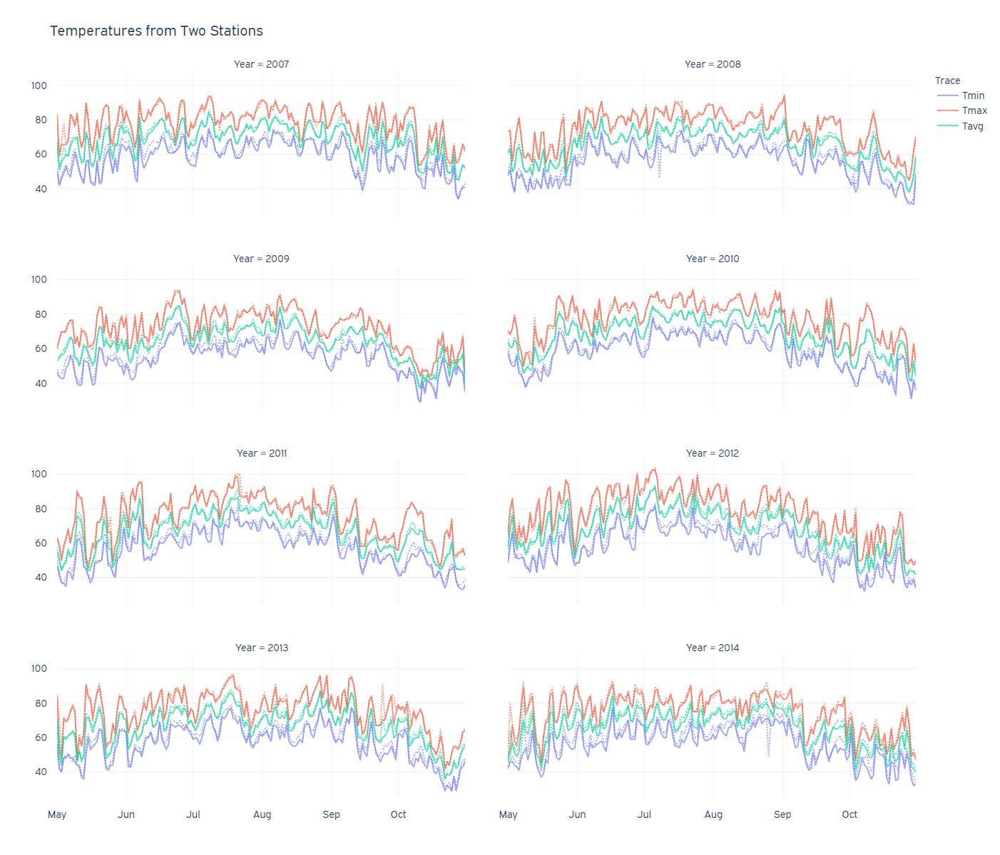

In [59]:
# Compare temperatures from station 1 and station 2.
fig = xp.line(temperature, 
              x="Date",
              y="Temperature", 
              line_group="Station",
              color="Trace",
              custom_data=["Station", "Trace"], 
              facet_col="Year", 
              facet_col_wrap=2, 
              facet_col_spacing=0.05,
              category_orders={"Trace": ["Tmin", "Tmax", "Tavg"]},
              title="Temperatures from Two Stations", 
              width=1200, 
              height=1200)

fig.update_traces(hovertemplate="<br>".join(["Station = %{customdata[0]}",
                                             "Date = %{x|%b %d, %Y}", 
                                             "Trace = %{customdata[1]}", 
                                             "Temperature = %{y}", 
                                             "<extra></extra>"]))

fig.update_xaxes(matches=None, 
                 tickformat="%b",
                 title=None)

fig.update_yaxes(title=None)

for trace in fig.data:
    if trace.customdata[0][0] == 2:
        trace.line.dash = "dot"

fig.prettify()

In [60]:
# Since the temperatures from both stations are roughly the same, we can fill the missing temperature departures with the values from the other station.
weather["Depart"] = pd.to_numeric(weather["Depart"], errors="coerce").fillna(method="ffill")

In [61]:
weather["Depart"].dtype

dtype('float64')

#### `WetBulb` 

In [62]:
non_numerics["WetBulb"]

{'M'}

In [63]:
# The missing wet bulb temperatures come from both stations.
weather.loc[weather["WetBulb"] == "M", ["Date", "Station", "WetBulb"]]

,Date,Station,WetBulb
848,2009-06-26,1,M
2410,2013-08-10,1,M
2412,2013-08-11,1,M
2415,2013-08-12,2,M


In [64]:
# Convert values except "M" in the `WetBulb` column to a numeric type.
weather["WetBulb"] = pd.to_numeric(weather["WetBulb"], errors="coerce")

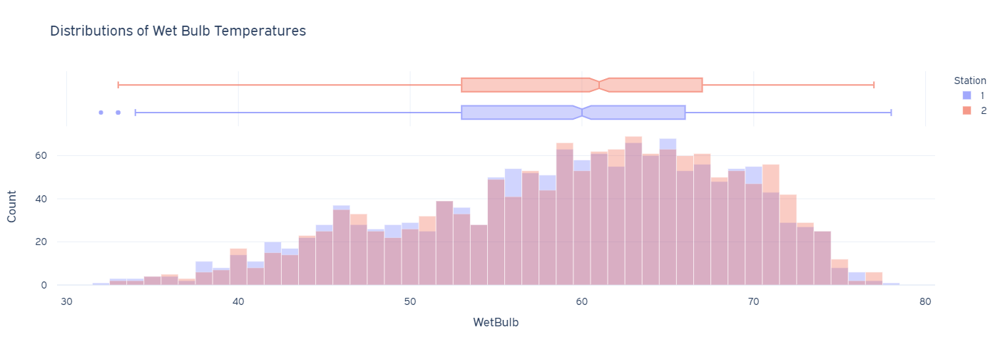

In [65]:
fig = xp.histogram(weather, 
                   x="WetBulb", 
                   color="Station", 
                   marginal="box", 
                   barmode="overlay",
                   title="Distributions of Wet Bulb Temperatures", 
                   width=720, 
                   height=480)

fig.update_in(["layout", "yaxis", "title", "text"], str.title)

fig.prettify()

In [66]:
# Since the wet bulb temperatures from both stations are somewhat left skewed, we are going to fill the missing values with their corresponding medians.
impute_1 = weather.loc[weather["Station"] == 1, "WetBulb"].median()
impute_2 = weather.loc[weather["Station"] == 2, "WetBulb"].median()
weather.loc[weather["Station"] == 1, "WetBulb"] = weather.loc[weather["Station"] == 1, "WetBulb"].fillna(impute_1)
weather.loc[weather["Station"] == 2, "WetBulb"] = weather.loc[weather["Station"] == 2, "WetBulb"].fillna(impute_2)

In [67]:
weather["WetBulb"].dtype

dtype('float64')

#### `Heat` and `Cool`

In [68]:
non_numerics[["Heat", "Cool"]]

Heat    {M}
Cool    {M}
dtype: object

In [69]:
weather.loc[weather["Heat"] == "M", ["Date", "Station", "Heat", "Cool"]]

,Date,Station,Heat,Cool
7,2007-05-04,2,M,M
505,2008-07-08,2,M,M
675,2008-10-01,2,M,M
1637,2011-07-22,2,M,M
2067,2012-08-22,2,M,M
2211,2013-05-02,2,M,M
2501,2013-09-24,2,M,M
2511,2013-09-29,2,M,M
2525,2013-10-06,2,M,M
2579,2014-05-02,2,M,M


In [70]:
# All of the missing values in the `Heat` and `Cool` columns are from station 2. Both values are also missing on the same days. 
print(f"Missing heating : ", (weather["Heat"] == "M").sum())
print(f"Missing cooling : ", (weather["Cool"] == "M").sum())

Missing heating :  11
Missing cooling :  11


In [71]:
# Convert values except "M" in the `Heat` and `Cool` columns to a numeric type.
weather["Heat"] = pd.to_numeric(weather["Heat"], errors="coerce")
weather["Cool"] = pd.to_numeric(weather["Cool"], errors="coerce")

In [72]:
# Extract the heating and cooling degree days and unpivot the DataFrame for plotting.
degree_days = weather[["Date", "Year", "Station", "Heat", "Cool"]]
degree_days = degree_days.melt(id_vars=["Date", "Year", "Station"], var_name="Trace", value_name="DegreeDays")

In [73]:
degree_days.head(10)

,Date,Year,Station,Trace,DegreeDays
0,2007-05-01,2007,1,Heat,0.0
1,2007-05-01,2007,2,Heat,0.0
2,2007-05-02,2007,1,Heat,14.0
3,2007-05-02,2007,2,Heat,13.0
4,2007-05-03,2007,1,Heat,9.0
5,2007-05-03,2007,2,Heat,7.0
6,2007-05-04,2007,1,Heat,7.0
7,2007-05-04,2007,2,Heat,NaN
8,2007-05-05,2007,1,Heat,5.0
9,2007-05-05,2007,2,Heat,5.0


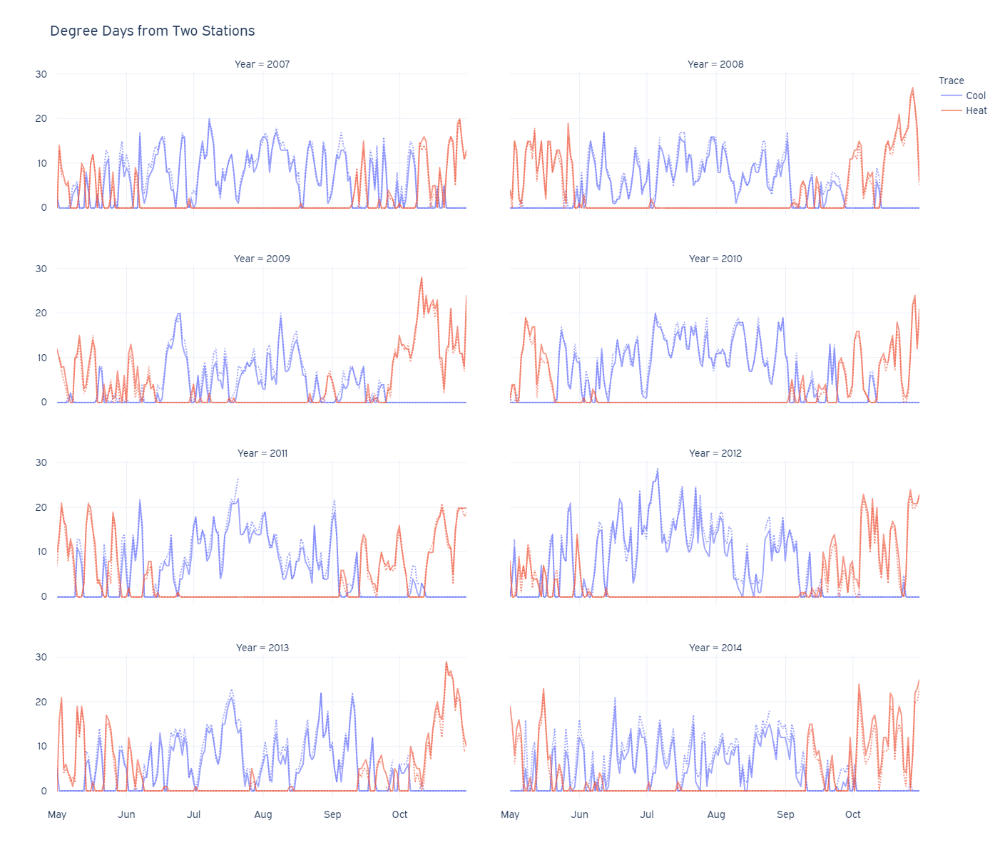

In [74]:
# Compare heating and cooling degree days from station 1 and station 2.
fig = xp.line(degree_days, 
              x="Date",
              y="DegreeDays", 
              line_group="Station",
              color="Trace",
              custom_data=["Station", "Trace"], 
              facet_col="Year", 
              facet_col_wrap=2, 
              facet_col_spacing=0.05,
              category_orders={"Trace": ["Cool", "Heat"]},
              title="Degree Days from Two Stations", 
              width=1200, 
              height=1200)

fig.update_traces(hovertemplate="<br>".join(["Station = %{customdata[0]}",
                                             "Date = %{x|%b %d, %Y}", 
                                             "Trace = %{customdata[1]}", 
                                             "Degree Days = %{y}", 
                                             "<extra></extra>"]))
    
fig.update_xaxes(matches=None, 
                 tickformat="%b",
                 title=None)

fig.update_yaxes(title=None)

for trace in fig.data:
    if trace.customdata[0][0] == 2:
        trace.line.dash = "dot"

fig.prettify()

In [75]:
# Since the degree days from both stations are roughly the same, we can fill the missing degree days with the values from the other station.
weather["Heat"].fillna(method="ffill", inplace=True)
weather["Cool"].fillna(method="ffill", inplace=True)

In [76]:
weather[["Heat", "Cool"]].dtypes

Heat    float64
Cool    float64
dtype: object

#### `Sunrise` and `Sunset`

In [77]:
non_numerics[["Sunrise", "Sunset"]]

Sunrise    {-}
Sunset     {-}
dtype: object

In [78]:
# The missing sunrise and sunset time comes only from the station 2.
print(weather[weather["Sunrise"] == "-"].groupby("Station").size())
print("---")
print(weather[weather["Sunset"] == "-"].groupby("Station").size())

Station
2    1472
dtype: int64
---
Station
2    1472
dtype: int64


In [79]:
# Since the reports are on the same days, we can fill the missing sunrise and sunset time with the values from the other station.
weather["Sunrise"] = weather["Sunrise"].replace("-", method="ffill")
weather["Sunset"] = weather["Sunset"].replace("-", method="ffill")

In [80]:
weather[["Date", "Station", "Sunrise", "Sunset"]]

,Date,Station,Sunrise,Sunset
0,2007-05-01,1,0448,1849
1,2007-05-01,2,0448,1849
2,2007-05-02,1,0447,1850
3,2007-05-02,2,0447,1850
4,2007-05-03,1,0446,1851
...,...,...,...,...
2939,2014-10-29,2,0620,1650
2940,2014-10-30,1,0622,1649
2941,2014-10-30,2,0622,1649
2942,2014-10-31,1,0623,1647


In [81]:
# Convert the `Sunrise` and `Sunset` columns to a datetime type.
weather["Sunrise"] = weather["Sunrise"].apply(lambda x: pd.Timedelta(f"{x[:2]} hours {x[2:]} minutes")) + weather["Date"]
weather["Sunset"] = weather["Sunset"].apply(lambda x: pd.Timedelta(f"{x[:2]} hours {x[2:]} minutes")) + weather["Date"]

In [82]:
weather[["Date", "Station", "Sunrise", "Sunset"]]

,Date,Station,Sunrise,Sunset
0,2007-05-01,1,2007-05-01 04:48:00,2007-05-01 18:49:00
1,2007-05-01,2,2007-05-01 04:48:00,2007-05-01 18:49:00
2,2007-05-02,1,2007-05-02 04:47:00,2007-05-02 18:50:00
3,2007-05-02,2,2007-05-02 04:47:00,2007-05-02 18:50:00
4,2007-05-03,1,2007-05-03 04:46:00,2007-05-03 18:51:00
...,...,...,...,...
2939,2014-10-29,2,2014-10-29 06:20:00,2014-10-29 16:50:00
2940,2014-10-30,1,2014-10-30 06:22:00,2014-10-30 16:49:00
2941,2014-10-30,2,2014-10-30 06:22:00,2014-10-30 16:49:00
2942,2014-10-31,1,2014-10-31 06:23:00,2014-10-31 16:47:00


#### `CodeSum`

In [83]:
# Missing data in the `CodeSum` column is represented by a blank space. 
non_numerics["CodeSum"]

{' ',
 'BCFG BR',
 'BR',
 'BR HZ',
 'BR HZ FU',
 'BR HZ VCFG',
 'BR VCTS',
 'DZ',
 'DZ BR',
 'DZ BR HZ',
 'FG BR HZ',
 'FG+',
 'FG+ BCFG BR',
 'FG+ BR',
 'FG+ BR HZ',
 'FG+ FG BR',
 'FG+ FG BR HZ',
 'FG+ MIFG BR',
 'FU',
 'HZ',
 'HZ FU',
 'HZ VCTS',
 'MIFG BCFG BR',
 'RA',
 'RA BCFG BR',
 'RA BR',
 'RA BR FU',
 'RA BR HZ',
 'RA BR HZ FU',
 'RA BR HZ VCFG',
 'RA BR HZ VCTS',
 'RA BR SQ',
 'RA BR VCFG',
 'RA BR VCTS',
 'RA DZ',
 'RA DZ BR',
 'RA DZ BR HZ',
 'RA DZ FG+ BCFG BR',
 'RA DZ FG+ BR',
 'RA DZ FG+ BR HZ',
 'RA DZ FG+ FG BR',
 'RA DZ SN',
 'RA FG BR',
 'RA FG+ BR',
 'RA FG+ MIFG BR',
 'RA HZ',
 'RA SN',
 'RA SN BR',
 'RA VCTS',
 'TS',
 'TS BR',
 'TS BR HZ',
 'TS HZ',
 'TS RA',
 'TS RA BR',
 'TS RA BR HZ',
 'TS RA FG+ FG BR',
 'TS TSRA',
 'TS TSRA BR',
 'TS TSRA BR HZ',
 'TS TSRA GR RA BR',
 'TS TSRA HZ',
 'TS TSRA RA',
 'TS TSRA RA BR',
 'TS TSRA RA BR HZ',
 'TS TSRA RA BR HZ VCTS',
 'TS TSRA RA BR VCTS',
 'TS TSRA RA FG BR',
 'TS TSRA RA FG BR HZ',
 'TS TSRA RA HZ',
 'TS TSRA RA

In [84]:
# Replace the blank spaces with `numpy.nan`.
weather["CodeSum"] = weather["CodeSum"].replace("^\s+$", np.nan, regex=True)

In [85]:
# Extract the different weather phenomena observed.
phenomena = set.union(*weather["CodeSum"].dropna().apply(lambda x: set(x.split())))

In [86]:
phenomena

{'BCFG',
 'BR',
 'DZ',
 'FG',
 'FG+',
 'FU',
 'GR',
 'HZ',
 'MIFG',
 'RA',
 'SN',
 'SQ',
 'TS',
 'TSRA',
 'VCFG',
 'VCTS'}

In [87]:
# Find if the weather observed on each day contains these phenomena.
for phen in phenomena:
    weather[phen] = weather["CodeSum"].dropna().str.contains(phen).astype(int)

In [88]:
weather[phenomena]

,RA,FU,TS,TSRA,MIFG,FG,SN,DZ,FG+,BR,GR,VCTS,VCFG,BCFG,SQ,HZ
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2939,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2941,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2942,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [89]:
# The missing weather phenomena come from both station 1 and station 2.
weather[weather["CodeSum"].isna()].groupby("Station").size()

Station
1    805
2    804
dtype: int64

In [90]:
# Replace the missing values with their corresponding modes.
impute_1 = weather.loc[weather["Station"] == 1, phenomena].mode().to_dict(orient="records")
impute_2 = weather.loc[weather["Station"] == 2, phenomena].mode().to_dict(orient="records")
weather.loc[weather["Station"] == 1, phenomena] = weather.loc[weather["Station"] == 1, phenomena].fillna(*impute_1)
weather.loc[weather["Station"] == 2, phenomena] = weather.loc[weather["Station"] == 2, phenomena].fillna(*impute_2)

In [91]:
weather[phenomena].isna().sum()

RA      0
FU      0
TS      0
TSRA    0
MIFG    0
FG      0
SN      0
DZ      0
FG+     0
BR      0
GR      0
VCTS    0
VCFG    0
BCFG    0
SQ      0
HZ      0
dtype: int64

In [92]:
weather[phenomena].dtypes

RA      float64
FU      float64
TS      float64
TSRA    float64
MIFG    float64
FG      float64
SN      float64
DZ      float64
FG+     float64
BR      float64
GR      float64
VCTS    float64
VCFG    float64
BCFG    float64
SQ      float64
HZ      float64
dtype: object

#### `Depth`

In [93]:
non_numerics["Depth"]

{'M'}

In [94]:
# The missing snow/ice depths come only from station 2.
weather[weather["Depth"] == "M"].groupby("Station").size()

Station
2    1472
dtype: int64

In [95]:
# The depths from station 1 contain only 0.
weather.loc[weather["Station"] == 1, "Depth"].value_counts()

0    1472
Name: Depth, dtype: int64

In [96]:
# Therefore, we are going to replace the missing values from station 2 with 0 as well.
weather["Depth"] = pd.to_numeric(weather["Depth"], errors="coerce").fillna(0)

In [97]:
weather["Depth"].dtype

dtype('float64')

#### `Water1`

In [98]:
non_numerics["Water1"]

{'M'}

In [99]:
# The water equivalent snow/ice depths are missing from both stations.
weather[weather["Water1"] == "M"].groupby("Station").size()

Station
1    1472
2    1472
dtype: int64

In [100]:
# Since the snow/ice depths are 0, their water equivalent must also be 0.
weather["Water1"] = 0

In [101]:
weather["Water1"].dtype

dtype('int64')

#### `SnowFall`

In [102]:
non_numerics["SnowFall"]

{'  T', 'M'}

In [103]:
# Station 1 reports some trace snowfall, whereas the data from station 2 are completely missing.
weather[weather["SnowFall"].isin({"  T", "M"})].groupby(["Station", "SnowFall"]).size()

Station  SnowFall
1          T           12
2        M           1472
dtype: int64

In [104]:
# Replace the trace values with 0, and fill the missing values of station 2 from station 1.
weather["SnowFall"] = weather["SnowFall"].replace("  T", 0).pipe(pd.to_numeric, errors="coerce").fillna(method="ffill")

In [105]:
weather["SnowFall"].dtype

dtype('float64')

#### `PrecipTotal`

In [106]:
non_numerics["PrecipTotal"]

{'  T', 'M'}

In [107]:
# Both stations report some trace precipitations, whereas the missing values come only from station 2.
weather[weather["PrecipTotal"].isin({"  T", "M"})].groupby(["Station", "PrecipTotal"]).size()

Station  PrecipTotal
1          T            163
2          T            155
         M                2
dtype: int64

In [108]:
weather.loc[weather["PrecipTotal"] == "M", ["Date", "Station", "PrecipTotal"]]

,Date,Station,PrecipTotal
117,2007-06-28,2,M
119,2007-06-29,2,M


In [109]:
# Replace the trace values wih 0, and fill the missing values of station 2 from station 1.
weather["PrecipTotal"] = weather["PrecipTotal"].replace("  T", 0).pipe(pd.to_numeric, errors="coerce").fillna(method="ffill")

In [110]:
weather["PrecipTotal"].dtype

dtype('float64')

#### `StnPressure`

In [111]:
non_numerics["StnPressure"]

{'M'}

In [112]:
# The missing station pressures come from both stations.
weather.loc[weather["StnPressure"] == "M", ["Date", "Station", "StnPressure"]]

,Date,Station,StnPressure
87,2007-06-13,2,M
848,2009-06-26,1,M
2410,2013-08-10,1,M
2411,2013-08-10,2,M


In [113]:
# Convert values except "M" in the `StnPressure` column to a numeric type.
weather["StnPressure"] = pd.to_numeric(weather["StnPressure"], errors="coerce")

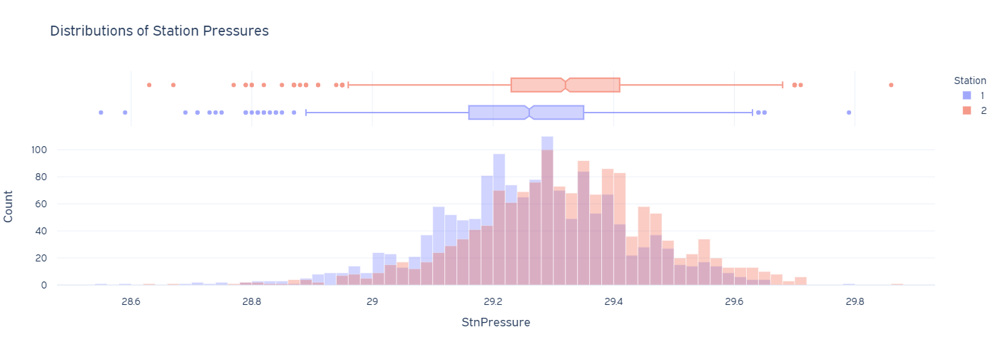

In [114]:
fig = xp.histogram(weather, 
                   x="StnPressure", 
                   color="Station", 
                   marginal="box", 
                   barmode="overlay",
                   title="Distributions of Station Pressures", 
                   width=720, 
                   height=480)

fig.update_in(["layout", "yaxis", "title", "text"], str.title)

fig.prettify()

In [115]:
# Since the station pressures from both stations are somewhat symmetrically distributed, we are going to fill the missing values with their corresponding means.
impute_1 = weather.loc[weather["Station"] == 1, "StnPressure"].mean()
impute_2 = weather.loc[weather["Station"] == 2, "StnPressure"].mean()
weather.loc[weather["Station"] == 1, "StnPressure"] = weather.loc[weather["Station"] == 1, "StnPressure"].fillna(impute_1)
weather.loc[weather["Station"] == 2, "StnPressure"] = weather.loc[weather["Station"] == 2, "StnPressure"].fillna(impute_2)

In [116]:
weather["StnPressure"].dtype

dtype('float64')

#### `SeaLevel`

In [117]:
non_numerics["SeaLevel"]

{'M'}

In [118]:
# The missing sea level pressures come from both stations.
weather.loc[weather["SeaLevel"] == "M", ["Date", "Station", "SeaLevel"]]

,Date,Station,SeaLevel
87,2007-06-13,2,M
832,2009-06-18,1,M
994,2009-09-07,1,M
1732,2011-09-08,1,M
1745,2011-09-14,2,M
1756,2011-09-20,1,M
2067,2012-08-22,2,M
2090,2012-09-03,1,M
2743,2014-07-23,2,M


In [119]:
# Convert values except "M" in the `SeaLevel` column to a numeric type.
weather["SeaLevel"] = pd.to_numeric(weather["SeaLevel"], errors="coerce")

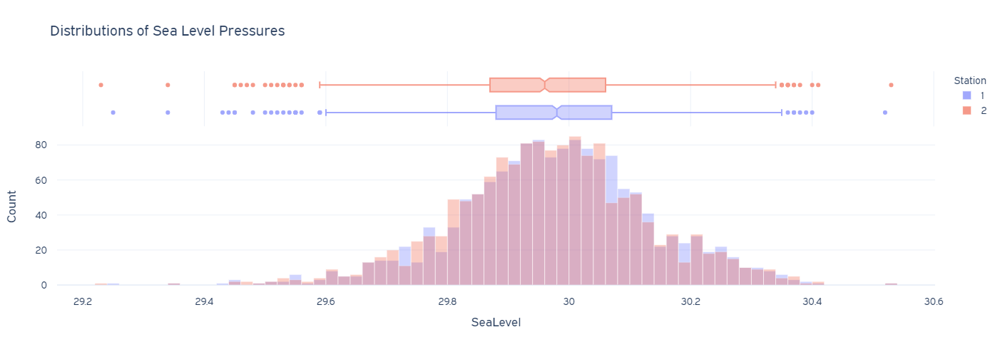

In [120]:
fig = xp.histogram(weather, 
                   x="SeaLevel", 
                   color="Station", 
                   marginal="box", 
                   barmode="overlay",
                   title="Distributions of Sea Level Pressures", 
                   width=720, 
                   height=480)

fig.update_in(["layout", "yaxis", "title", "text"], str.title)

fig.prettify()

In [121]:
# Since the sea level pressures from both stations are somewhat symmetrically distributed, we are going to fill the missing values with their corresponding means.
impute_1 = weather.loc[weather["Station"] == 1, "SeaLevel"].mean()
impute_2 = weather.loc[weather["Station"] == 2, "SeaLevel"].mean()
weather.loc[weather["Station"] == 1, "SeaLevel"] = weather.loc[weather["Station"] == 1, "SeaLevel"].fillna(impute_1)
weather.loc[weather["Station"] == 2, "SeaLevel"] = weather.loc[weather["Station"] == 2, "SeaLevel"].fillna(impute_2)

In [122]:
weather["SeaLevel"].dtype

dtype('float64')

#### `AvgSpeed`

In [123]:
non_numerics["AvgSpeed"]

{'M'}

In [124]:
# The missing average wind speeds come only from station 2.
weather.loc[weather["AvgSpeed"] == "M", ["Date", "Station", "AvgSpeed"]]

,Date,Station,AvgSpeed
87,2007-06-13,2,M
1745,2011-09-14,2,M
2067,2012-08-22,2,M


In [125]:
# Convert values except "M" in the `AvgSpeed` column to a numeric type.
weather["AvgSpeed"] = pd.to_numeric(weather["AvgSpeed"], errors="coerce")

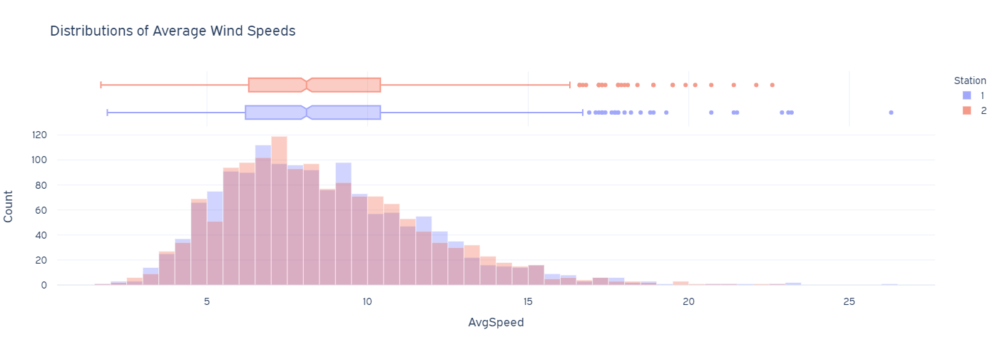

In [126]:
fig = xp.histogram(weather, 
                   x="AvgSpeed", 
                   color="Station", 
                   marginal="box", 
                   barmode="overlay",
                   title="Distributions of Average Wind Speeds", 
                   width=720, 
                   height=480)

fig.update_in(["layout", "yaxis", "title", "text"], str.title)

fig.prettify()

In [127]:
# Since the average wind speeds from both stations are somewhat right skewed, we are going to fill the missing values with their corresponding medians.
impute_1 = weather.loc[weather["Station"] == 1, "AvgSpeed"].median()
impute_2 = weather.loc[weather["Station"] == 2, "AvgSpeed"].median()
weather.loc[weather["Station"] == 1, "AvgSpeed"] = weather.loc[weather["Station"] == 1, "AvgSpeed"].fillna(impute_1)
weather.loc[weather["Station"] == 2, "AvgSpeed"] = weather.loc[weather["Station"] == 2, "AvgSpeed"].fillna(impute_2)

In [128]:
weather["AvgSpeed"].dtype

dtype('float64')

<big>Verifications:</big>

In [129]:
weather.dtypes

Station                 int64
Date           datetime64[ns]
Tmax                    int64
Tmin                    int64
Tavg                  float64
Depart                float64
DewPoint                int64
WetBulb               float64
Heat                  float64
Cool                  float64
Sunrise        datetime64[ns]
Sunset         datetime64[ns]
CodeSum                object
Depth                 float64
Water1                  int64
SnowFall              float64
PrecipTotal           float64
StnPressure           float64
SeaLevel              float64
ResultSpeed           float64
ResultDir               int64
AvgSpeed              float64
Month                  object
Year                    int64
RA                    float64
FU                    float64
TS                    float64
TSRA                  float64
MIFG                  float64
FG                    float64
SN                    float64
DZ                    float64
FG+                   float64
BR        

In [130]:
weather.isna().sum()

Station           0
Date              0
Tmax              0
Tmin              0
Tavg              0
Depart            0
DewPoint          0
WetBulb           0
Heat              0
Cool              0
Sunrise           0
Sunset            0
CodeSum        1609
Depth             0
Water1            0
SnowFall          0
PrecipTotal       0
StnPressure       0
SeaLevel          0
ResultSpeed       0
ResultDir         0
AvgSpeed          0
Month             0
Year              0
RA                0
FU                0
TS                0
TSRA              0
MIFG              0
FG                0
SN                0
DZ                0
FG+               0
BR                0
GR                0
VCTS              0
VCFG              0
BCFG              0
SQ                0
HZ                0
dtype: int64

## Feature Engineering

### Weather

#### Daytime

Calculate daytime on each day by subtracting sunrise time from sunset time.

$$ \large{Daytime = Sunset - Sunrise} $$

In [131]:
weather["Daytime"] = (weather["Sunset"]-weather["Sunrise"]) / pd.Timedelta("1 minute")

In [132]:
weather[["Date", "Station", "Sunrise", "Sunset", "Daytime"]]

,Date,Station,Sunrise,Sunset,Daytime
0,2007-05-01,1,2007-05-01 04:48:00,2007-05-01 18:49:00,841.0
1,2007-05-01,2,2007-05-01 04:48:00,2007-05-01 18:49:00,841.0
2,2007-05-02,1,2007-05-02 04:47:00,2007-05-02 18:50:00,843.0
3,2007-05-02,2,2007-05-02 04:47:00,2007-05-02 18:50:00,843.0
4,2007-05-03,1,2007-05-03 04:46:00,2007-05-03 18:51:00,845.0
...,...,...,...,...,...
2939,2014-10-29,2,2014-10-29 06:20:00,2014-10-29 16:50:00,630.0
2940,2014-10-30,1,2014-10-30 06:22:00,2014-10-30 16:49:00,627.0
2941,2014-10-30,2,2014-10-30 06:22:00,2014-10-30 16:49:00,627.0
2942,2014-10-31,1,2014-10-31 06:23:00,2014-10-31 16:47:00,624.0


#### Relative Humidity

Calculate the relative humidity on each day from the observed average temperature and the observed dew point temperature, using the formula:

$$ \large{RH = \frac{e}{e_s} \times 100\%} $$

where 

- $e_s$ is the standard vapor pressure
- $e$ is the actual vapor pressure

The standard vapor pressure ($e_s$) and the actual vapor pressure ($e$) are given by

$$ \large{e_s = 6.11 \ \mathrm{E+} \left( \frac{7.5 \times T}{237.7 + T} \right)} $$

$$ \large{e = 6.11 \ \mathrm{E+} \left( \frac{7.5 \times T_d}{237.7 + T_d} \right)} $$

where 

- $T$ is the air temperature in Celsius 
- $T_d$ is the dew point temperature in Celsius

In order to convert the temperature from Fahrenheit to Celsius, the following formula is used:

$$ \large{ C = \frac{5}{9} \times \left( F - 32 \right) } $$

where

- $C$ is the temperature in Celsius
- $F$ is the temperature in Fahrenheit

In [133]:
# Convert the temperatures from Fahrenheit to Celsius.
air_celsius = 5 * (weather["Tavg"] - 32) / 9
dew_celsius = 5 * (weather["DewPoint"] - 32) / 9

In [134]:
# Calculate the standard and actual vapor pressures.
standard_pressure = 6.11 * 10**(7.5 * air_celsius / (237.7+air_celsius))
actual_pressure = 6.11 * 10**(7.5 * dew_celsius / (237.7+dew_celsius))

In [135]:
# Calculate the relative humidity.
weather["Humidity"] = actual_pressure / standard_pressure

In [136]:
weather["Humidity"]

0       0.564632
1       0.545531
2       0.711862
3       0.686059
4       0.548663
          ...   
2939    0.651233
2940    0.730479
2941    0.677739
2942    0.546508
2943    0.596697
Name: Humidity, Length: 2944, dtype: float64

<big>Verifications:</big>

In [137]:
weather.isna().sum()

Station           0
Date              0
Tmax              0
Tmin              0
Tavg              0
Depart            0
DewPoint          0
WetBulb           0
Heat              0
Cool              0
Sunrise           0
Sunset            0
CodeSum        1609
Depth             0
Water1            0
SnowFall          0
PrecipTotal       0
StnPressure       0
SeaLevel          0
ResultSpeed       0
ResultDir         0
AvgSpeed          0
Month             0
Year              0
RA                0
FU                0
TS                0
TSRA              0
MIFG              0
FG                0
SN                0
DZ                0
FG+               0
BR                0
GR                0
VCTS              0
VCFG              0
BCFG              0
SQ                0
HZ                0
Daytime           0
Humidity          0
dtype: int64

In [138]:
weather.dtypes

Station                 int64
Date           datetime64[ns]
Tmax                    int64
Tmin                    int64
Tavg                  float64
Depart                float64
DewPoint                int64
WetBulb               float64
Heat                  float64
Cool                  float64
Sunrise        datetime64[ns]
Sunset         datetime64[ns]
CodeSum                object
Depth                 float64
Water1                  int64
SnowFall              float64
PrecipTotal           float64
StnPressure           float64
SeaLevel              float64
ResultSpeed           float64
ResultDir               int64
AvgSpeed              float64
Month                  object
Year                    int64
RA                    float64
FU                    float64
TS                    float64
TSRA                  float64
MIFG                  float64
FG                    float64
SN                    float64
DZ                    float64
FG+                   float64
BR        

### Train

#### Nearest Station

The geolocations of the two weather stations are as follows:

- Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT 
    - Lat: `41.995` 
    - Lon: `-87.933` 
    - Elev: 662 ft. above sea level
- Station 2: CHICAGO MIDWAY INTL ARPT 
    - Lat: `41.786` 
    - Lon: `-87.752` 
    - Elev: 612 ft. above sea level

In [139]:
# Find the nearest station by comparing the (Euclidean) distances from each trap to the two stations.
def get_nearest_station(lat, lon):
    if (lat-41.995)**2 + (lon-(-87.933))**2 < (lat-41.786)**2 + (lon-(-87.752))**2:
        return 1
    else:
        return 2 

In [140]:
# The nearest station for each trap will correspond to the shortest distance.
train["Station"] = train[["Latitude", "Longitude"]].apply(lambda row: get_nearest_station(row["Latitude"], row["Longitude"]), axis="columns")

In [141]:
train["Station"]

0       2
24      2
23      2
22      2
21      1
       ..
8412    1
8411    2
8410    2
8430    2
8474    2
Name: Station, Length: 8475, dtype: int64

In [142]:
train.dtypes

Date            datetime64[ns]
Species                 object
Trap                    object
Latitude               float64
Longitude              float64
NumMosquitos             int64
WnvPresent               int64
Station                  int64
dtype: object

# EDA

In [143]:
# Merge the train and weather DataFrames on the `Date` and (nearest) `Station` columns.
train_weather = train.merge(weather, how="left", on=["Date", "Station"])

In [144]:
train_weather.shape

(8475, 48)

In [145]:
train_weather.dtypes

Date            datetime64[ns]
Species                 object
Trap                    object
Latitude               float64
Longitude              float64
NumMosquitos             int64
WnvPresent               int64
Station                  int64
Tmax                     int64
Tmin                     int64
Tavg                   float64
Depart                 float64
DewPoint                 int64
WetBulb                float64
Heat                   float64
Cool                   float64
Sunrise         datetime64[ns]
Sunset          datetime64[ns]
CodeSum                 object
Depth                  float64
Water1                   int64
SnowFall               float64
PrecipTotal            float64
StnPressure            float64
SeaLevel               float64
ResultSpeed            float64
ResultDir                int64
AvgSpeed               float64
Month                   object
Year                     int64
RA                     float64
FU                     float64
TS      

In [146]:
train_weather.isna().sum()

Date               0
Species            0
Trap               0
Latitude           0
Longitude          0
NumMosquitos       0
WnvPresent         0
Station            0
Tmax               0
Tmin               0
Tavg               0
Depart             0
DewPoint           0
WetBulb            0
Heat               0
Cool               0
Sunrise            0
Sunset             0
CodeSum         4811
Depth              0
Water1             0
SnowFall           0
PrecipTotal        0
StnPressure        0
SeaLevel           0
ResultSpeed        0
ResultDir          0
AvgSpeed           0
Month              0
Year               0
RA                 0
FU                 0
TS                 0
TSRA               0
MIFG               0
FG                 0
SN                 0
DZ                 0
FG+                0
BR                 0
GR                 0
VCTS               0
VCFG               0
BCFG               0
SQ                 0
HZ                 0
Daytime            0
Humidity     

In [147]:

wnv_percent = train_weather["WnvPresent"].value_counts(normalize=True).rename("WnvPercent").to_frame("WnvPresent")

In [148]:
wnv_percent

,WnvPresent
0,0.946077
1,0.053923


In [149]:

wnv_month = train_weather.groupby("Month", sort=False)["WnvPresent"].value_counts(normalize=True).rename("WnvPercent").reset_index()

In [150]:
wnv_month["WnvPresent"] = wnv_month["WnvPresent"].astype(bool)

In [151]:
wnv_month

,Month,WnvPresent,WnvPercent
0,May,False,1.000000
1,Jun,False,0.999252
2,Jun,True,0.000748
3,Jul,False,0.980439
4,Jul,True,0.019561
5,Aug,False,0.889818
6,Aug,True,0.110182
7,Sep,False,0.943503
8,Sep,True,0.056497
9,Oct,False,0.992424


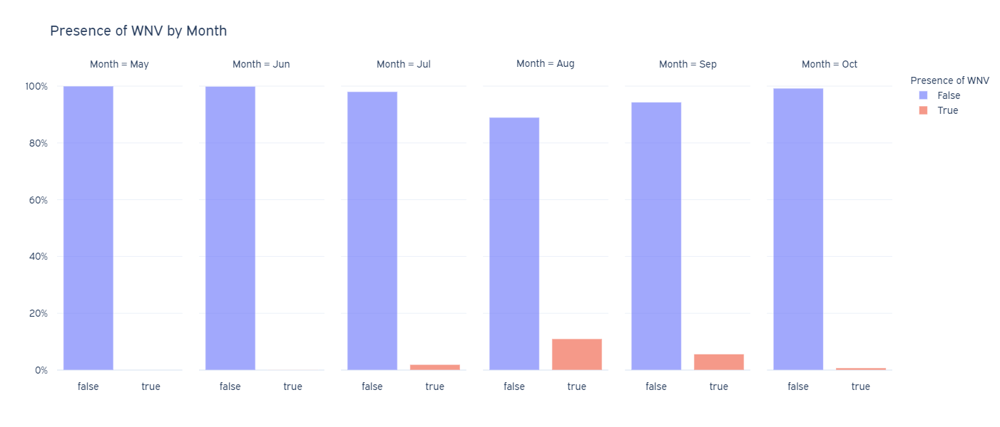

In [152]:
fig = xp.bar(wnv_month,
             x="WnvPresent",
             y="WnvPercent",
             color="WnvPresent",
             facet_col="Month",
             title="Presence of WNV by Month",
             width=1200,
             height=600)

fig.update_layout(legend={"title": {"text": "Presence of WNV"}})
fig.update_xaxes(title=None)
fig.update_yaxes(tickformat="%", 
                 title=None)

fig.prettify()

In [153]:

wnv_species = train_weather.groupby("Species", sort=False)["WnvPresent"].value_counts(normalize=True).rename("WnvPercent").reset_index()

In [154]:
wnv_species["WnvPresent"] = wnv_species["WnvPresent"].astype(bool)

In [155]:
wnv_species

,Species,WnvPresent,WnvPercent
0,CULEX PIPIENS/RESTUANS,False,0.941192
1,CULEX PIPIENS/RESTUANS,True,0.058808
2,CULEX RESTUANS,False,0.979941
3,CULEX RESTUANS,True,0.020059
4,CULEX PIPIENS,False,0.905641
5,CULEX PIPIENS,True,0.094359
6,CULEX SALINARIUS,False,1.000000
7,CULEX TERRITANS,False,1.000000
8,CULEX TARSALIS,False,1.000000
9,CULEX ERRATICUS,False,1.000000


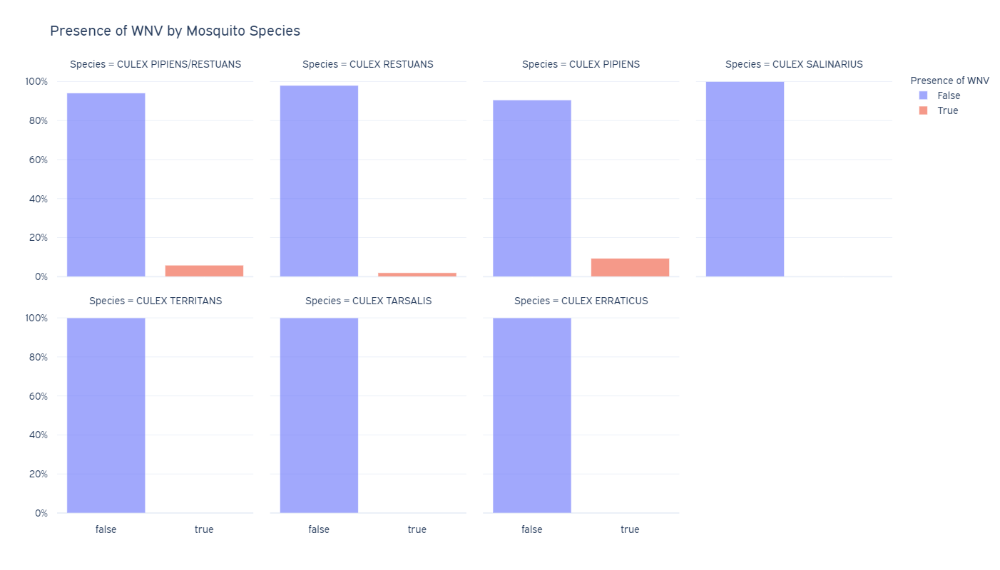

In [156]:
fig = xp.bar(wnv_species,
             x="WnvPresent",
             y="WnvPercent",
             color="WnvPresent",
             facet_col="Species",
             facet_col_wrap=4,
             title="Presence of WNV by Mosquito Species",
             width=1200,
             height=800)

fig.update_layout(legend={"title": {"text": "Presence of WNV"}})
fig.update_xaxes(title=None)
fig.update_yaxes(tickformat="%", 
                 title=None)

fig.prettify()

In [157]:
train_weather["Daytime"].dtype

dtype('float64')

In [158]:

wnv_daytime = train_weather.groupby("Daytime")["WnvPresent"].mean().rename("WnvPercent").reset_index()

In [159]:
wnv_daytime

,Daytime,WnvPercent
0,683.0,0.000000
1,697.0,0.011050
2,706.0,0.000000
3,708.0,0.000000
4,719.0,0.045977
...,...,...
60,910.0,0.000000
61,911.0,0.000000
62,912.0,0.003175
63,913.0,0.000000


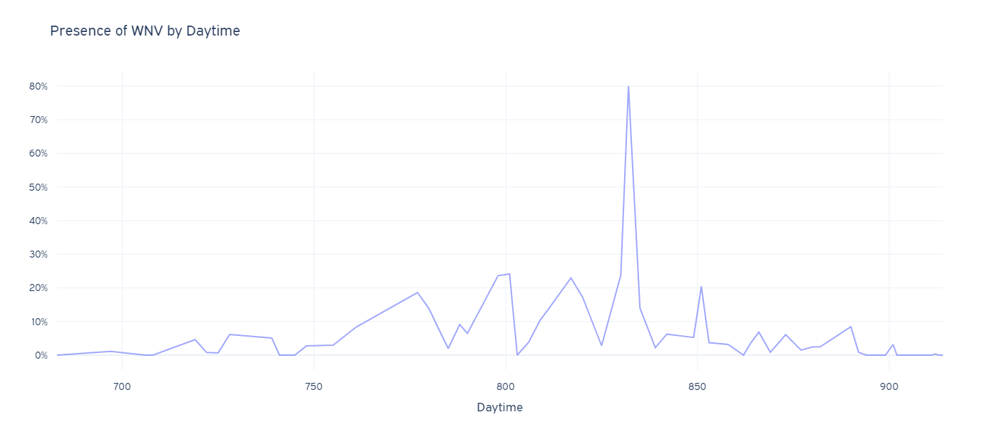

In [160]:
fig = xp.line(wnv_daytime,
             x="Daytime",
             y="WnvPercent",
             title="Presence of WNV by Daytime",
             width=800,
             height=600)

fig.update_yaxes(tickformat="%", 
                 title=None)

fig.prettify()

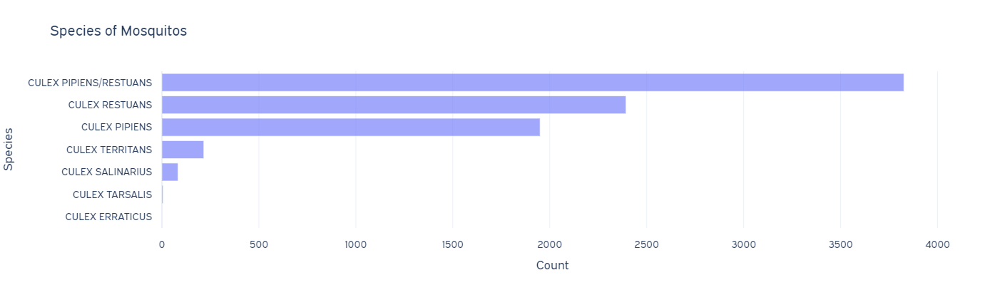

In [161]:
fig = xp.histogram(train_weather, 
                   y="Species",
                   title="Species of Mosquitos",
                   width=600,
                   height=400)

fig.update_in(["layout", "xaxis", "title", "text"], str.title)

fig.update_yaxes(categoryorder="total ascending")

fig.prettify()

# Visualization

In [162]:
def center(series):
    """
    Get the center value (middle between minimum and maximum) of a `Series`.
    """
    return (series.min() + series.max()) / 2

In [163]:
def set_timeline_hovertemplate(trace, frame):
    """
    Set the hovertemplate for the timeline map from the specified `Trace` and `Frame`.
    """
    hoverlines = [trace.legendgroup, 
                  "---",
                  "Latitude = %{lat}", 
                  "Longitude = %{lon}",
                  "<extra></extra>"]
    
    if trace.legendgroup.startswith("WNV"):
        hoverlines.insert(2, "Species = %{customdata[0]}")
        hoverlines.insert(2, "Mosquitos = %{marker.size}")
    
    if trace.legendgroup == "Weather Station":
        hoverlines.insert(2, "Station = %{customdata[1]}")
    else:
        hoverlines.insert(2, f"Date = {frame['name']}")
    
    trace.hovertemplate = "<br>".join(hoverlines)

In [164]:
def make_timeline_map(train, spray):
    """
    Make a scatter mapbox Figure depicting timelines from the train and spray DataFrames.
    """
    # Create new columns for plotting.
    train["Item"] = train["WnvPresent"].map({0: "WNV Negative", 
                                             1: "WNV Positive"})
    train["Size"] = train["NumMosquitos"]
    
    spray["Item"] = "Spray"
    spray["Size"] = 1

    # Concatenate the train and spray DataFrames.
    train_spray = pd.concat([train, spray])

    # Append a dummy DataFrame to include all items on each date.
    dummy = []

    for date in train_spray["Date"].unique():
        dummy.append([date, "WNV Negative", 0, 0, np.nan, np.nan])
        dummy.append([date, "WNV Positive", 0, 0, np.nan, np.nan])
        dummy.append([date, "Spray", 0, 0, np.nan, np.nan])
        dummy.append([date, "Weather Station", 10, 1, 41.995, -87.933]) # Station 1
        dummy.append([date, "Weather Station", 10, 2, 41.786, -87.752]) # Station 2

    train_spray = pd.concat([train_spray, pd.DataFrame(dummy, columns=["Date", "Item", "Size", "Station", "Latitude", "Longitude"])])

    # Sort the train-spray DataFrame by `Date` and `Station`.
    train_spray.sort_values(["Date", "Station"], ascending=[True, True], inplace=True)

    # Convert the `Date` column to a string type for plotting.
    train_spray["Date"] = train_spray["Date"].astype(str) 

    # Plot a scatter mapbox.
    fig = xp.scatter_mapbox(train_spray, 
                            lat="Latitude", 
                            lon="Longitude", 
                            color="Item",
                            size="Size",
                            custom_data=["Species", "Station"],
                            animation_frame="Date",
                            labels={"Item": ""},
                            size_max=40,
                            mapbox_style="carto-positron", 
                            width=800, 
                            height=800)

    for trace in fig.data:
        set_timeline_hovertemplate(trace, fig.frames[0])

    for frame in fig.frames:
        for trace in frame.data:
            set_timeline_hovertemplate(trace, frame)

    fig.prettify()
    
    return fig

## Mosquitos and WNV

In [ ]:
# Visualize the number of mosquitos and the incidence of WNV. 
fig = make_timeline_map(train, spray)

fig = fig.update_layout(mapbox={"center": {"lat": center(train["Latitude"]), 
                                           "lon": center(train["Longitude"])}, 
                                "zoom": 9}, 
                        title="Mosquitos and Incidence of WNV")

# Display the chart.
fig.show()

# Save the chart as a gif image.
fig.export_gif("../images/wnv-incidence.gif")

<big>Descriptions:</big>

- The colors denote what each area represents:
    - blue : trap with WNV negative (not present)
    - red : trap with WNV positive (present)
    - green : sprayed area
    - purple : weather station (1 or 2) 
- The sizes of the dots represent the number of mosquitos found on each trap.

<big>Notes:</big>

- The sizes of spray and weather stations do not represent anything.

## Effect of Sprays

In [ ]:
# Set a time range to examine before and after each spray.
delta = pd.Timedelta("30 days")

In [ ]:
# Visualize the effect of each spray.
for date in spray["Date"].unique():
    spray_involved = spray[spray["Date"] == date]
    
    fig = make_timeline_map(train[train["Date"].between(date-delta, date+delta)], 
                            spray_involved)
    
    fig.update_layout(mapbox={"center": {"lat": center(spray_involved["Latitude"]),
                                         "lon": center(spray_involved["Longitude"])}, 
                              "zoom": 12},
                      title="Effect of Spray on " + np.datetime_as_string(date, unit="D"))

    # Display the chart.
    fig.show()

    # Save the chart as a gif image.
    fig.export_gif(f"../images/spray-{np.datetime_as_string(date, unit='D')}.gif")

<big>Descriptions:</big>

- The colors denote what each area represents:
    - blue : trap with WNV negative (not present)
    - red : trap with WNV positive (present)
    - green : sprayed area
    - purple : weather station (1 or 2) 
- The sizes of the dots represent the number of mosquitos found on each trap.

<big>Notes:</big>

- The first spray location is very distant from the available traps. Its effect cannot be studied.
- The sizes of spray and weather stations do not represent anything.

<big>Findings:</big>

- The locations of spray are quite off from our traps. I am not sure if this is intentional.
- It is quite hard to tell if spray is effective in killing the mosquitos.
- The number of mosquitoes found after sprayed is sure to be less, but we can observe this similar trend in other unsprayed areas as well.
- Most of the time, WNV-positive traps change to WNV-negative after sprayed. However, the effect does not last long. WNV sometimes returns 14 days - 1 month later.

## Months and Presence of WNV 

In [ ]:
# Create new columns: `Month` and `Year`.
train["Month"] = train["Date"].dt.strftime("%b")
train["Year"] = train["Date"].dt.year

In [ ]:
train[["Date", "Month", "Year"]]

In [ ]:
train.columns.to_list()